In [5]:
import requests
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import TimeSeriesSplit, cross_val_score, train_test_split, GridSearchCV
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from skopt import BayesSearchCV
from skopt.space import Real, Categorical, Integer
from xgboost import XGBRegressor
import itertools
import concurrent.futures
import random
from deap import base, creator, tools, algorithms
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.feature_selection import SelectFromModel
from sklearn.pipeline import Pipeline
import time
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.seasonal import seasonal_decompose
from pmdarima import auto_arima


from scipy import stats

In [6]:
cik = '0000320193'
headers = {
    'User-Agent': 'mazsikafan@gmail.com'
}
companyfacts = requests.get(f'https://data.sec.gov/api/xbrl/companyfacts/CIK{cik}.json',headers=headers)



In [7]:
companyfacts.json()['facts']['us-gaap']


{'AccountsPayable': {'label': 'Accounts Payable (Deprecated 2009-01-31)',
  'description': "Carrying value as of the balance sheet date of liabilities incurred (and for which invoices have typically been received) and payable to vendors for goods and services received that are used in an entity's business. For classified balance sheets, used to reflect the current portion of the liabilities (due within one year or within the normal operating cycle if longer); for unclassified balance sheets, used to reflect the total liabilities (regardless of due date).",
  'units': {'USD': [{'end': '2008-09-27',
     'val': 5520000000,
     'accn': '0001193125-09-153165',
     'fy': 2009,
     'fp': 'Q3',
     'form': '10-Q',
     'filed': '2009-07-22',
     'frame': 'CY2008Q3I'},
    {'end': '2009-06-27',
     'val': 4854000000,
     'accn': '0001193125-09-153165',
     'fy': 2009,
     'fp': 'Q3',
     'form': '10-Q',
     'filed': '2009-07-22',
     'frame': 'CY2009Q2I'}]}},
 'AccountsPayableCurre

In [8]:
companyfacts.json()

{'cik': 320193,
 'entityName': 'Apple Inc.',
 'facts': {'dei': {'EntityCommonStockSharesOutstanding': {'label': 'Entity Common Stock, Shares Outstanding',
    'description': "Indicate number of shares or other units outstanding of each of registrant's classes of capital or common stock or other ownership interests, if and as stated on cover of related periodic report. Where multiple classes or units exist define each class/interest by adding class of stock items such as Common Class A [Member], Common Class B [Member] or Partnership Interest [Member] onto the Instrument [Domain] of the Entity Listings, Instrument.",
    'units': {'shares': [{'end': '2009-06-27',
       'val': 895816758,
       'accn': '0001193125-09-153165',
       'fy': 2009,
       'fp': 'Q3',
       'form': '10-Q',
       'filed': '2009-07-22',
       'frame': 'CY2009Q2I'},
      {'end': '2009-10-16',
       'val': 900678473,
       'accn': '0001193125-09-214859',
       'fy': 2009,
       'fp': 'FY',
       'form':

In [9]:
all_items = []

for key in companyfacts.json()['facts']['us-gaap']:
    # get the 'val' value from the dictionary
    if 'units' in companyfacts.json()['facts']['us-gaap'][key] and 'USD' in companyfacts.json()['facts']['us-gaap'][key]['units']:
        for item in companyfacts.json()['facts']['us-gaap'][key]['units']['USD']:
            if 'val' in item and item.get('form', '') == '10-K':
                all_items.append((key, item['val'], item.get('filed', 'N/A'), item.get('form', 'N/A')))

df = pd.DataFrame(all_items, columns=['key', 'val', 'filed', 'form'])
df


,key,val,filed,form
0,AccountsPayableCurrent,5.520000e+09,2009-10-27,10-K
1,AccountsPayableCurrent,5.601000e+09,2009-10-27,10-K
2,AccountsPayableCurrent,5.601000e+09,2010-10-27,10-K
3,AccountsPayableCurrent,1.201500e+10,2010-10-27,10-K
4,AccountsPayableCurrent,1.201500e+10,2011-10-26,10-K
...,...,...,...,...
6653,DeferredIncomeTaxAssetsNet,1.785200e+10,2023-11-03,10-K
6654,DeferredTaxLiabilitiesPropertyPlantAndEquipment,1.582000e+09,2023-11-03,10-K
6655,DeferredTaxLiabilitiesPropertyPlantAndEquipment,1.998000e+09,2023-11-03,10-K
6656,OtherAssetsMiscellaneousNoncurrent,3.905300e+10,2023-11-03,10-K


In [10]:

# Isolate the 'NetIncomeLoss' series
net_income_df = df[df['key'] == 'NetIncomeLoss'].copy()

# Make sure the DataFrame is sorted by date
net_income_df.sort_values('filed', inplace=True)

# Reset index for safety
net_income_df.reset_index(drop=True, inplace=True)
# If there are more entries for the same date, keep the last one
net_income_df.drop_duplicates('filed', keep='last', inplace=True)

# Reset index for safety
net_income_df.reset_index(drop=True, inplace=True)

net_income_df

,key,val,filed,form
0,NetIncomeLoss,5.704000e+09,2009-10-27,10-K
1,NetIncomeLoss,4.308000e+09,2010-10-27,10-K
2,NetIncomeLoss,3.378000e+09,2011-10-26,10-K
3,NetIncomeLoss,1.401300e+10,2012-10-31,10-K
4,NetIncomeLoss,2.592200e+10,2013-10-30,10-K
5,NetIncomeLoss,1.307800e+10,2014-10-27,10-K
6,NetIncomeLoss,1.112400e+10,2015-10-28,10-K
7,NetIncomeLoss,1.067700e+10,2016-10-26,10-K
8,NetIncomeLoss,1.071400e+10,2017-11-03,10-K
9,NetIncomeLoss,4.568700e+10,2018-11-05,10-K


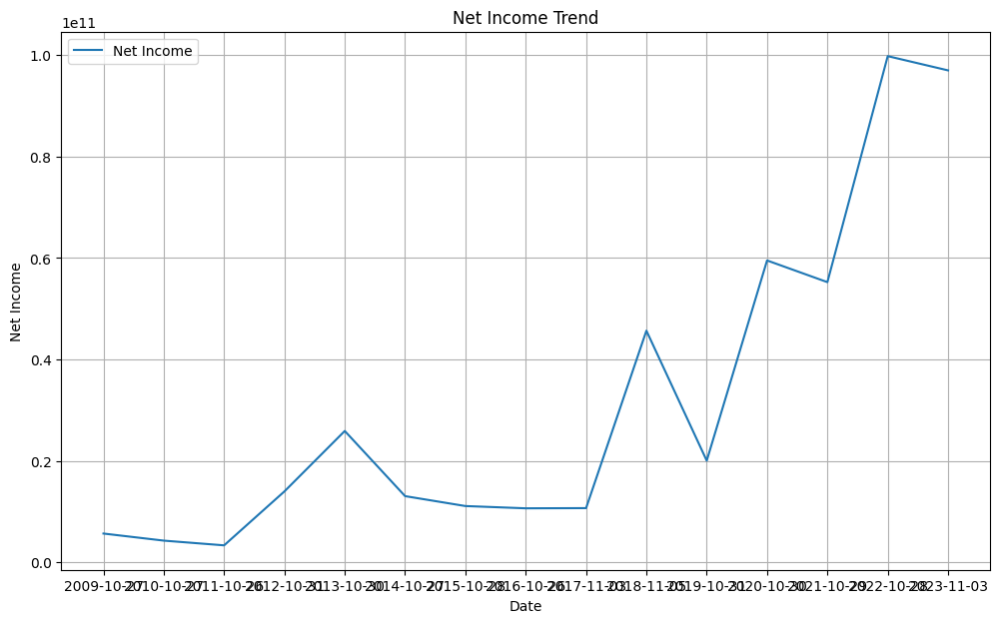

In [11]:
# Net income trend analysis with a simple plot
plt.figure(figsize=(12, 7))
plt.plot(net_income_df['filed'], net_income_df['val'], label='Net Income')
plt.title('Net Income Trend')
plt.xlabel('Date')
plt.ylabel('Net Income')
plt.legend()
plt.grid(True)
plt.show()

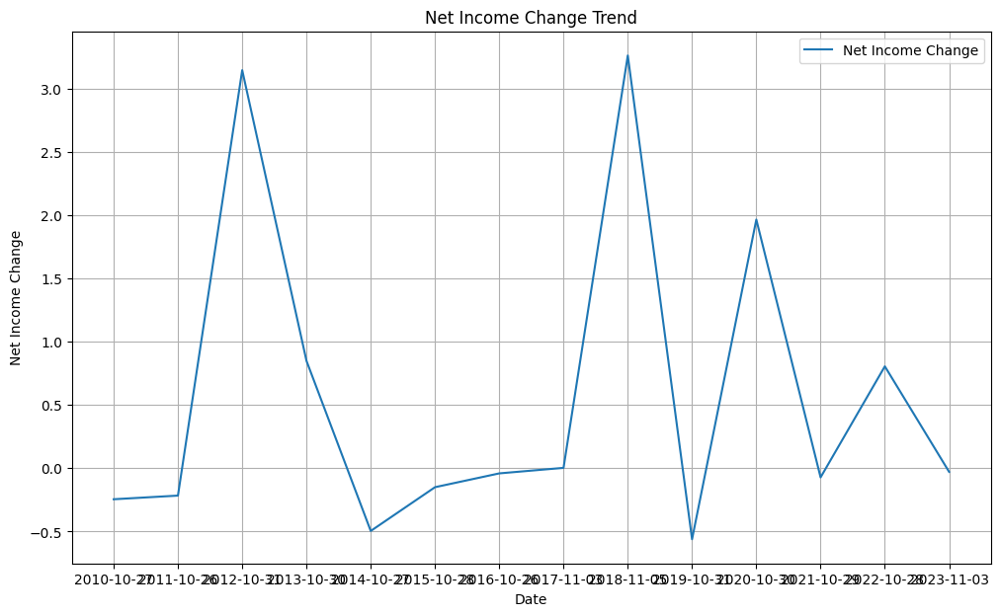

In [12]:
# Calculate the percentage change of the net income
net_income_df['net_income_change'] = net_income_df['val'].pct_change()

# Net income percentage change trend analysis with a simple plot
plt.figure(figsize=(12, 7))
plt.plot(net_income_df['filed'], net_income_df['net_income_change'], label='Net Income Change')
plt.title('Net Income Change Trend')
plt.xlabel('Date')
plt.ylabel('Net Income Change')
plt.legend()
plt.grid(True)
plt.show()


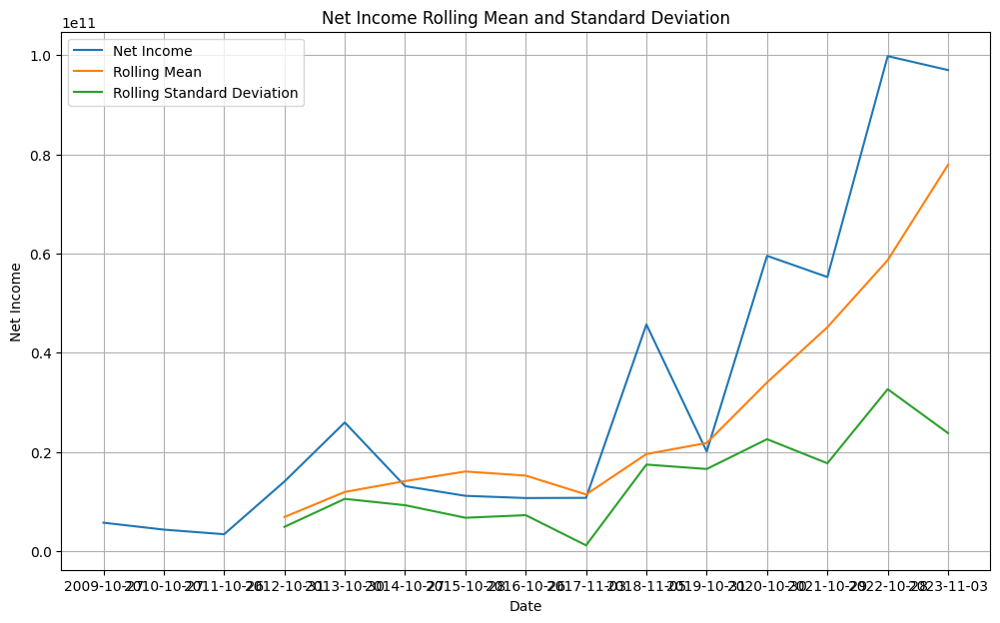

In [13]:
# Calculate the rolling mean and standard deviation of the net income
net_income_df['rolling_mean'] = net_income_df['val'].rolling(window=4).mean()
net_income_df['rolling_std'] = net_income_df['val'].rolling(window=4).std()

# Net income rolling mean and standard deviation trend analysis with a simple plot
plt.figure(figsize=(12, 7))
plt.plot(net_income_df['filed'], net_income_df['val'], label='Net Income')
plt.plot(net_income_df['filed'], net_income_df['rolling_mean'], label='Rolling Mean')
plt.plot(net_income_df['filed'], net_income_df['rolling_std'], label='Rolling Standard Deviation')
plt.title('Net Income Rolling Mean and Standard Deviation')
plt.xlabel('Date')
plt.ylabel('Net Income')
plt.legend()
plt.grid(True)
plt.show()



In [14]:
# Check for stationarity
result = adfuller(net_income_df['val'])
print('ADF Statistic:', result[0])
print('p-value:', result[1])
print('Critical Values:', result[4])



ADF Statistic: 1.9864024247062517
p-value: 0.9986550199712367
Critical Values: {'1%': -4.473135048010974, '5%': -3.28988060356653, '10%': -2.7723823456790124}


In [15]:
# Box-cox transformation
net_income_df['boxcox'], lam = stats.boxcox(net_income_df['val'])
print('Lambda:', lam)


Lambda: -0.05319563651257419


In [16]:
# Check for stationarity
result = adfuller(net_income_df['boxcox'])
print('ADF Statistic:', result[0])
print('p-value:', result[1])
print('Critical Values:', result[4])


ADF Statistic: 2.6741586715548027
p-value: 0.9990852170356441
Critical Values: {'1%': -4.473135048010974, '5%': -3.28988060356653, '10%': -2.7723823456790124}


ValueError: could not convert string to float: 'NetIncomeLoss'

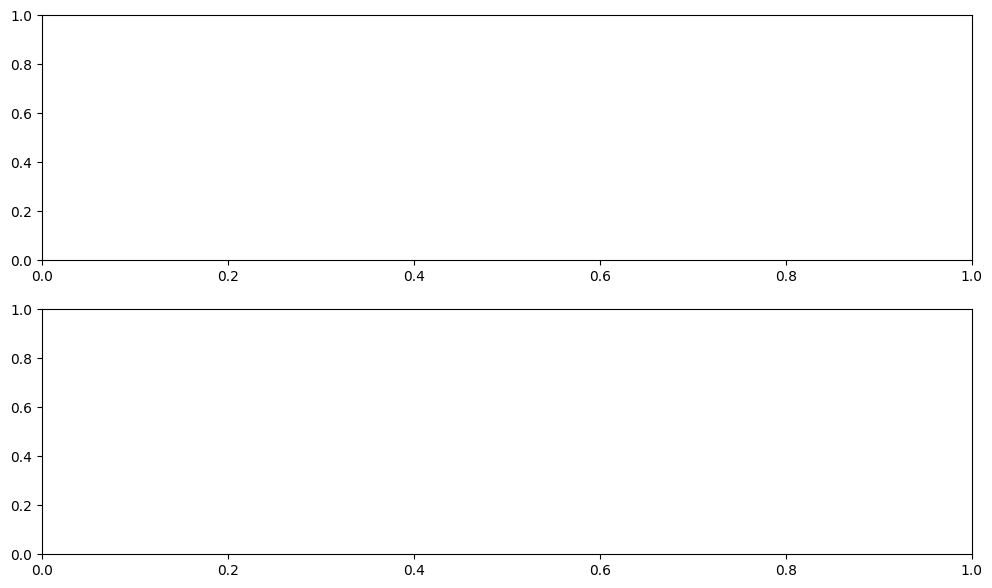

In [18]:
# ACF and PACF plots
def plot_acf_pacf(series, lags):
    fig, ax = plt.subplots(2, 1, figsize=(12, 7))
    plot_acf(series, lags=lags, ax=ax[0])
    plot_pacf(series, lags=lags, ax=ax[1])
    plt.show()

plot_acf_pacf(net_income_df, 20)

In [ ]:
# addressing singular matrix error
net_income_df['net_income_diff'] = net_income_df['net_income_diff'].shift(1)
net_income_df.dropna(inplace=True)

# ARIMA

# Split the data into training and testing sets
train_size = int(len(net_income_df) * 0.8)
train, test = net_income_df['net_income_diff'][:train_size], net_income_df['net_income_diff'][train_size:]

# Fit the ARIMA model
model = ARIMA(train, order=(1, 1, 1))
model_fit = model.fit

# Forecast the test data
forecast = model_fit().forecast(steps=len(test))

# Calculate the mean squared error
mse = mean_squared_error(test, forecast)
print('Mean Squared Error:', mse)

# Calculate the root mean squared error
rmse = np.sqrt(mse)

# Calculate the mean absolute error
mae = mean_absolute_error(test, forecast)

# Calculate the R-squared score
r2 = r2_score(test, forecast)

print('Root Mean Squared Error:', rmse)
print('Mean Absolute Error:', mae)
print('R-squared Score:', r2)





Mean Squared Error: 6.51815660269862e+20
Root Mean Squared Error: 25530680763.933067
Mean Absolute Error: 23189945861.59023
R-squared Score: -0.1710984019012205


/opt/homebrew/Caskroom/miniconda/base/envs/finance/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/opt/homebrew/Caskroom/miniconda/base/envs/finance/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/opt/homebrew/Caskroom/miniconda/base/envs/finance/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/opt/homebrew/Caskroom/miniconda/base/envs/finance/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/op